In [1]:
import sys
import pathlib

import asdf
import astropy.units as u
import astropy.table
import numpy as np
import matplotlib.pyplot as plt
import sunpy.map

sys.path.append('../scripts/')
import colormaps

# Data Analysis

First cut at analyzing the EM slope and time lag data

In [2]:
data_dir = pathlib.Path('/Volumes/My Passport for Mac/loops_workshop_2024/data')

In [3]:
ar_table = astropy.table.QTable.read(data_dir / 'tables' / 'mason_ars_region_1.asdf')

## Time Lags

Load time lags and max cross-correlations

In [4]:
max_cc_threshold = 0.25
tl_maps_aia = []
tl_maps_eis = []
cc_maps_aia = []
cc_maps_eis = []
for row in ar_table:
    # Time lags
    tl_dir = data_dir / f'noaa_{row["NOAA AR"]}' / 'diagnostics' / 'time_lag'
    cc_dir = data_dir / f'noaa_{row["NOAA AR"]}' / 'diagnostics' / 'max_cc'
    # AIA FOV
    cc_maps = sunpy.map.Map(sorted(cc_dir.glob(f'maxcc_noaa{row["NOAA AR"]}_fovAIA_*.fits')))
    cc_maps_aia.append({f'{m.meta["chan_a"]}_{m.meta["chan_b"]}': m for m in cc_maps})
    tl_maps = sunpy.map.Map(sorted(tl_dir.glob(f'timelag_noaa{row["NOAA AR"]}_fovAIA_*.fits')))
    for mcc,mtl in zip(cc_maps,tl_maps):
        mtl.mask = mcc.data < max_cc_threshold 
    tl_maps_aia.append({f'{m.meta["chan_a"]}_{m.meta["chan_b"]}': m for m in tl_maps})
    # EIS FOV    
    cc_maps = sunpy.map.Map(sorted(cc_dir.glob(f'maxcc_noaa{row["NOAA AR"]}_fovEIS_*.fits')))
    cc_maps_eis.append({f'{m.meta["chan_a"]}_{m.meta["chan_b"]}': m for m in cc_maps})
    tl_maps = sunpy.map.Map(sorted(tl_dir.glob(f'timelag_noaa{row["NOAA AR"]}_fovEIS_*.fits')))
    for mcc,mtl in zip(cc_maps,tl_maps):
        mtl.mask = mcc.data < max_cc_threshold 
    tl_maps_eis.append({f'{m.meta["chan_a"]}_{m.meta["chan_b"]}': m for m in tl_maps})

In [5]:
tl_131_flare_threshold = -2500
flare_masks_aia = [np.any([v.data < tl_131_flare_threshold for k,v in tlma.items() if '131' in k],axis=0) for tlma in tl_maps_aia]
flare_masks_eis = [np.any([v.data < tl_131_flare_threshold for k,v in tlma.items() if '131' in k],axis=0) for tlma in tl_maps_eis]

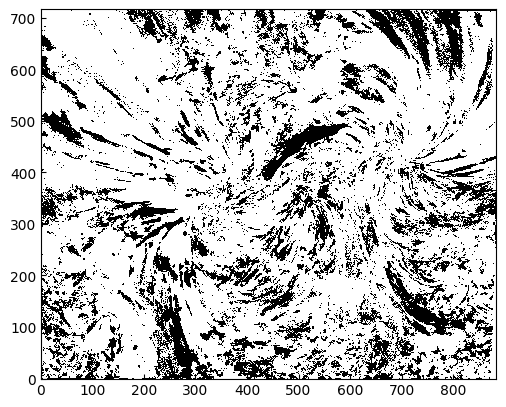

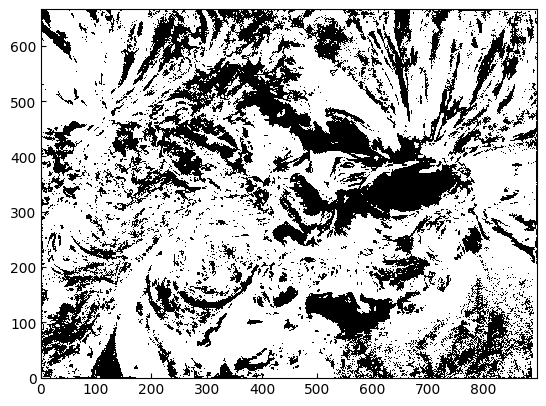

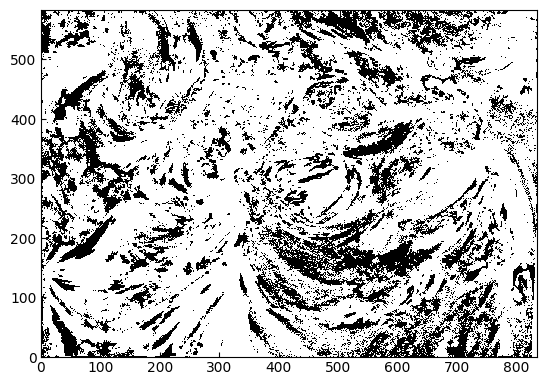

In [6]:
for fm in flare_masks_aia:
    plt.imshow(fm, origin='lower', interpolation='none',vmin=0,vmax=1,cmap='Greys',aspect=1)
    plt.show()

## EM Slopes

In [7]:
em_slopes_eis = []
em_slopes_aia = []
em_slopes_aia_eis_fov = []
for row in ar_table:
    dem_dir = data_dir / f'noaa_{row["NOAA AR"]}' / 'diagnostics' / 'dem'
    with asdf.open(dem_dir / f'emslope_noaa{row["NOAA AR"]}_eis.asdf', lazy_load=False, copy_arrays=True) as af:
        sm = af['slope_map']
        em_slopes_eis.append(sm)
    with asdf.open(dem_dir / f'emslope_noaa{row["NOAA AR"]}_fovAIA.asdf', lazy_load=False, copy_arrays=True) as af:
        sm = af['slope_map']
        em_slopes_aia.append(sm)
    with asdf.open(dem_dir / f'emslope_noaa{row["NOAA AR"]}_fovEIS.asdf', lazy_load=False, copy_arrays=True) as af:
        sm = af['slope_map']
        em_slopes_aia_eis_fov.append(sm)

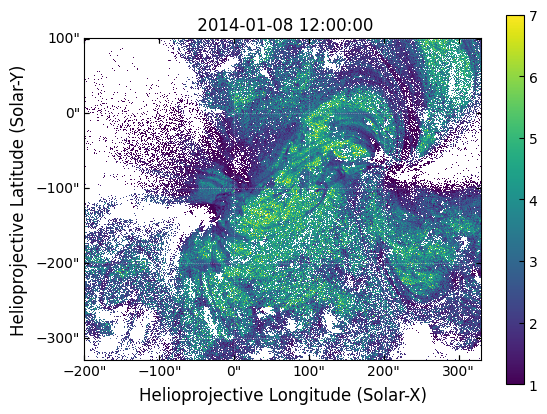

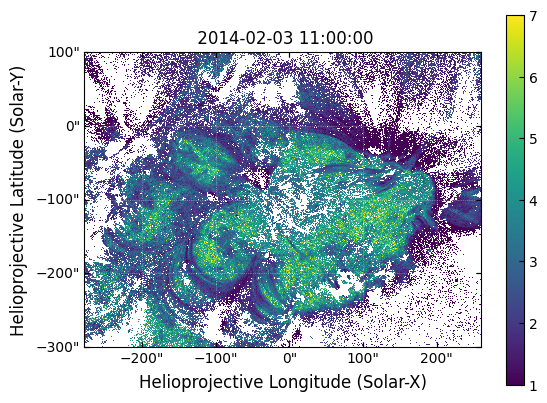

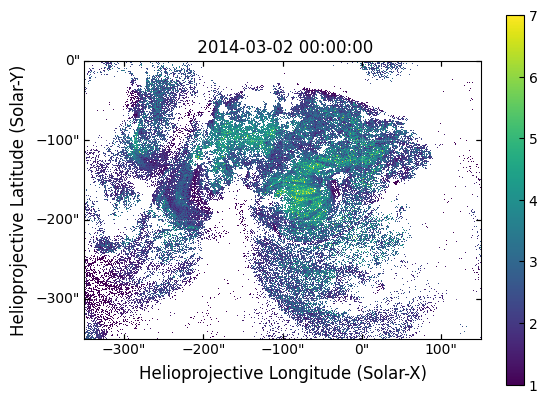

In [8]:
for i,sm in enumerate(em_slopes_aia):
    #sm.mask = np.any([sm.mask, flare_masks_aia[i]],axis=0)
    sm.peek(vmin=1, vmax=7, cmap='viridis')

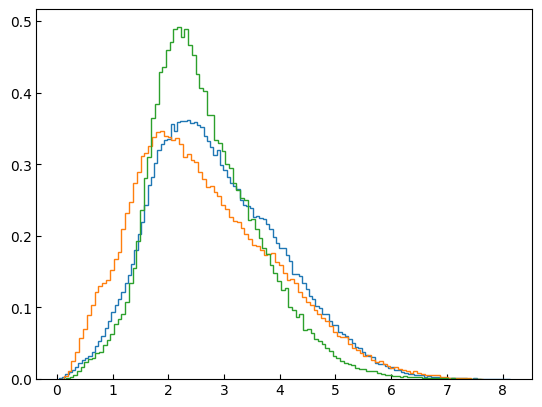

In [9]:
bins = np.linspace(0,8,100)
for fm,sm in zip(flare_masks_aia,em_slopes_aia):
    plt.hist(sm.data[~np.any([sm.mask,fm],axis=0)], bins='scott', density=True,histtype='step')
    #combined_mask = np.any([sm.mask, fm], axis=0)
    #plt.imshow()

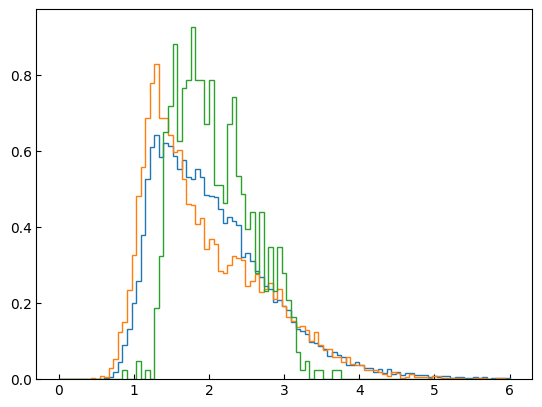

In [10]:
bins = np.linspace(0,6,100)
for fm,sm in zip(flare_masks_eis, em_slopes_eis):
    plt.hist(sm.data[~np.any([sm.mask,fm],axis=0)], bins=bins, density=True,histtype='step',)

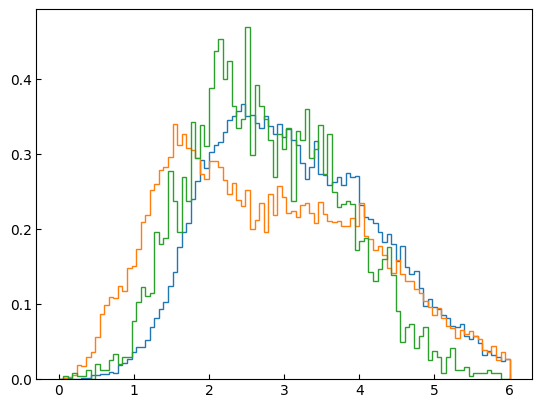

In [11]:
#bins = np.linspace(0,8,150)
for fm,sm in zip(flare_masks_eis, em_slopes_aia_eis_fov):
    plt.hist(sm.data[~np.any([sm.mask,fm],axis=0)], bins=bins, density=True,histtype='step',)

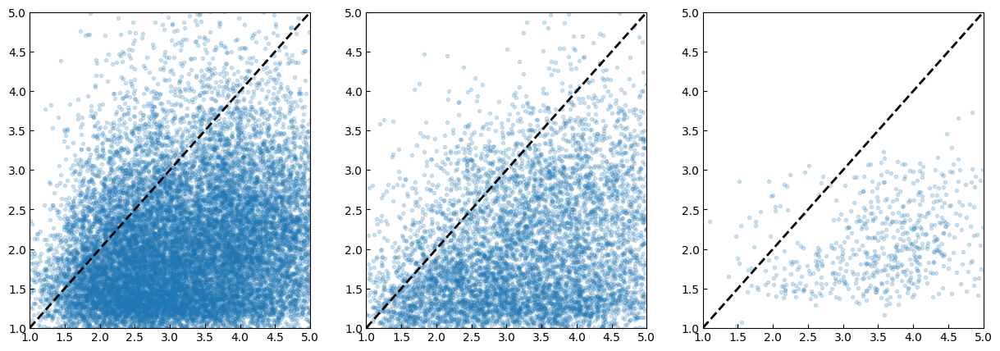

In [23]:
bins = np.linspace(0,6,100)
fig = plt.figure(figsize=(15,5))
for i,(fm,sm_eis,sm_aia) in enumerate(zip(flare_masks_eis, em_slopes_eis, em_slopes_aia_eis_fov)):
    combined_mask = np.any([sm_eis.mask,sm_aia.mask,fm], axis=0)
    ax = fig.add_subplot(1,3,i+1)
    ax.scatter(sm_aia.data[~combined_mask], sm_eis.data[~combined_mask],alpha=0.2,marker='.')
    ax.plot(np.linspace(1,5,100),np.linspace(1,5,100),color='k',ls='--')
    ax.set_xlim(1,5)
    ax.set_ylim(1,5)

In [93]:
foo = sunpy.map.Map(data_dir / 'noaa_11967' / 'AIA' / 'level_2' / 'aia.lev2_euv_12s.2014-02-03T050001Z.171.image.fits')

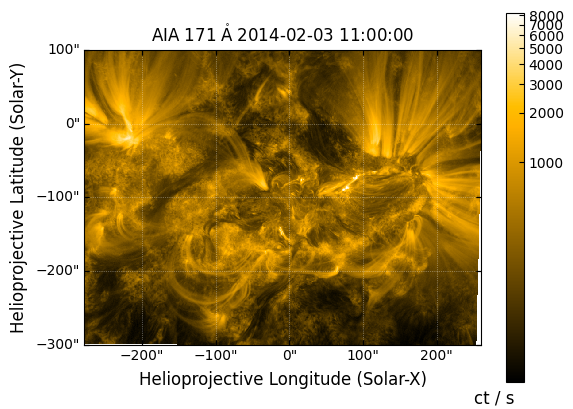

In [94]:
foo.peek()

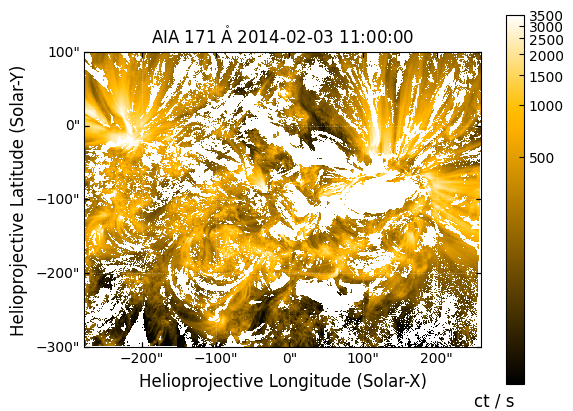

In [95]:
foo.mask = flare_masks_aia[1]
foo.peek(clip_interval=(1,99.9)*u.percent)

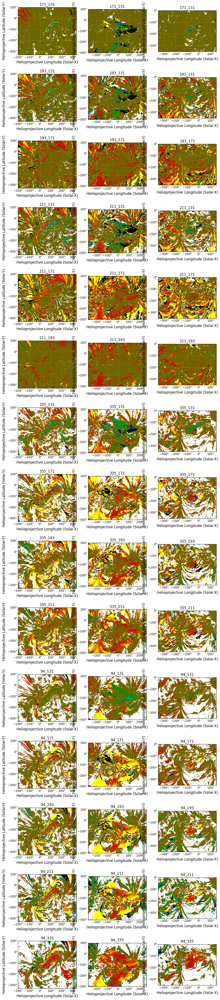

In [97]:
fig = plt.figure(figsize=(12,60))
for i,md in enumerate(tl_maps_aia):
    nr = len(md)
    nc = len(tl_maps_aia)
    for j,key in enumerate(md):
        _m = md[key]
        ax = fig.add_subplot(nr,nc,j*nc+i+1,projection=_m)
        #v.mask = flare_mask
        _m.plot(axes=ax,vmin=-7200,vmax=7200,cmap='idl_bgry_004',title=key)

In [115]:
(3*u.h).to_value('s')

np.float64(10800.0)

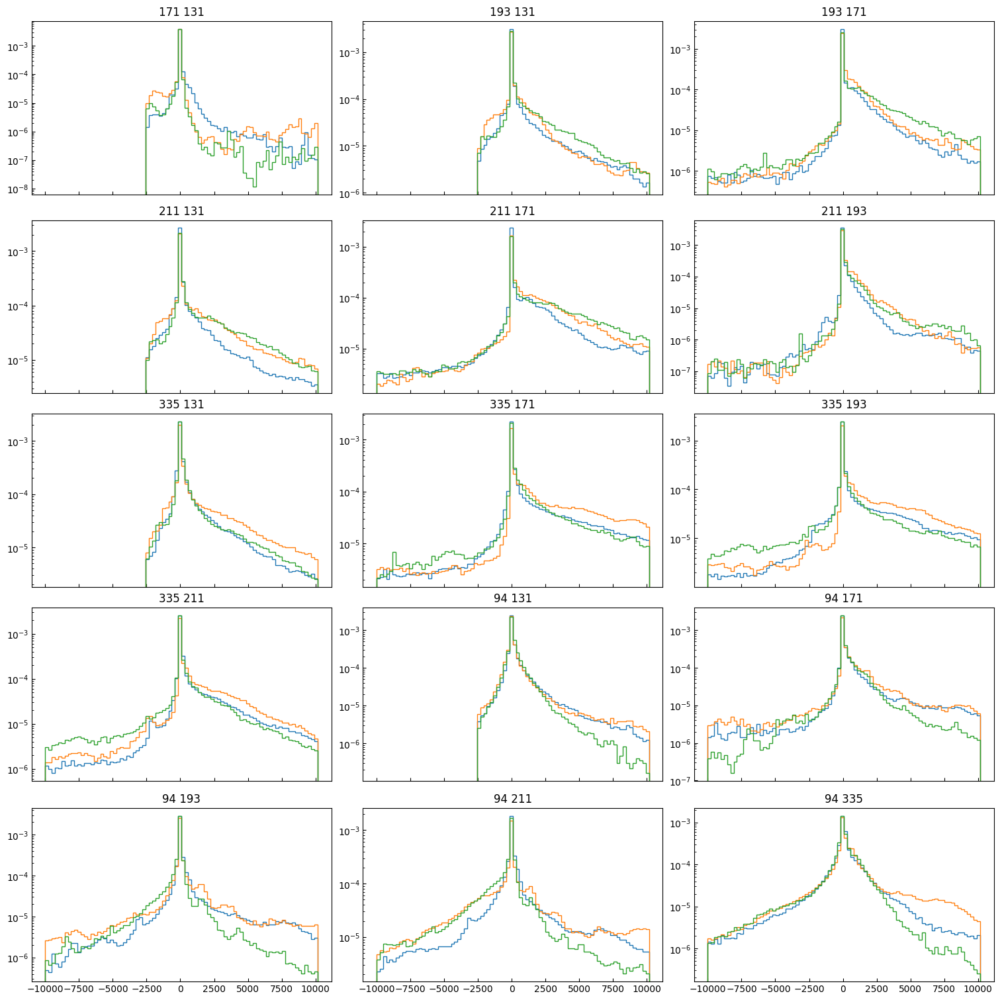

In [114]:
dt = 240
bin_lim = 1e4
bins = np.arange(-bin_lim,bin_lim+dt,dt)
fig,axes = plt.subplots(5,3,figsize=(15,15),sharex=True, sharey=False,layout='constrained')
for ax,key in zip(axes.flatten(),tl_maps_aia[0].keys()):
    for i,md in enumerate(tl_maps_aia):
        _m = md[key]
        combined_mask = np.any([_m.mask, flare_masks_aia[i]],axis=0)
        ax.hist(_m.data[~combined_mask], bins=bins, histtype='step', density=True, log=True)
    #ax.label_outer()
    ax.set_title(' '.join(key.split('_')))

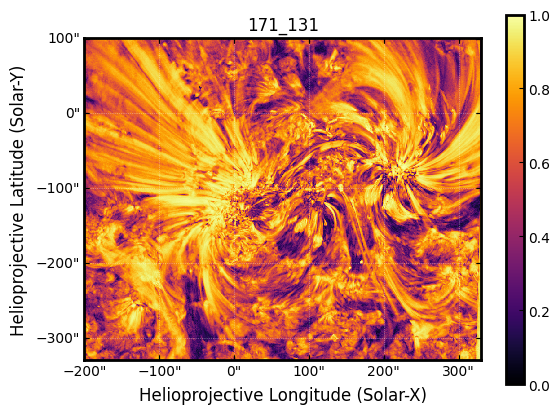

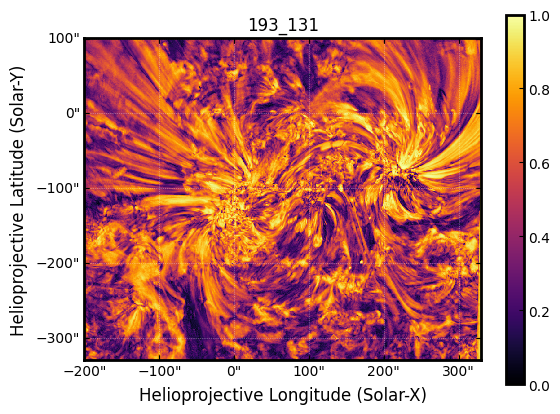

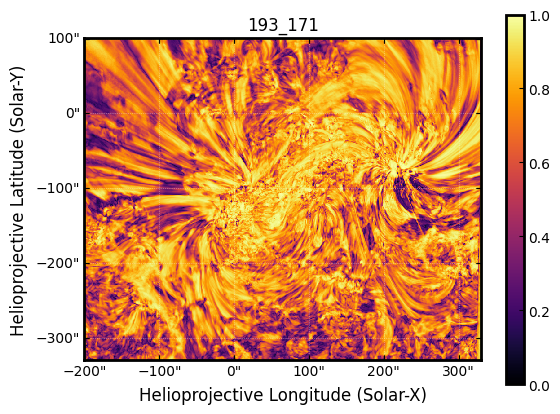

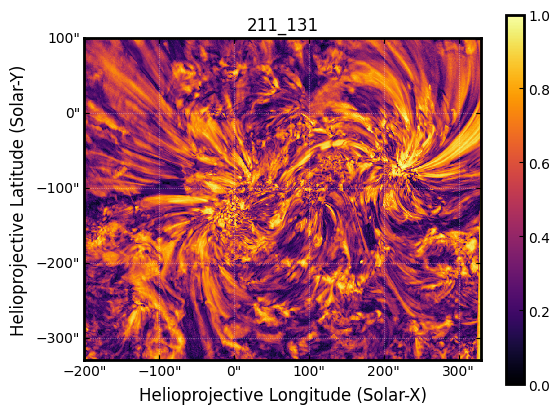

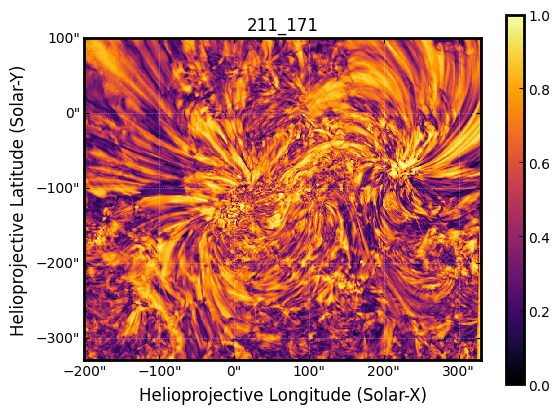

...

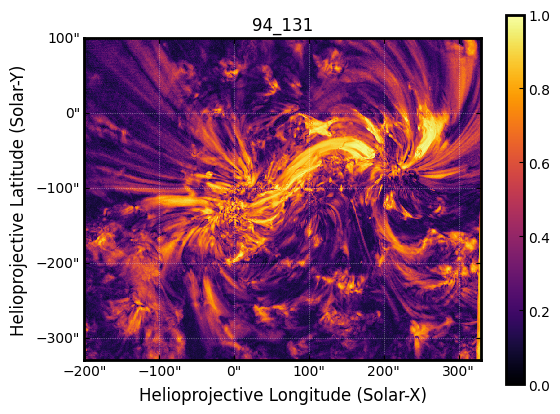

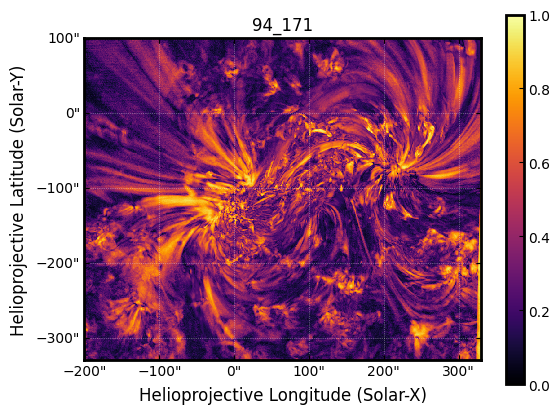

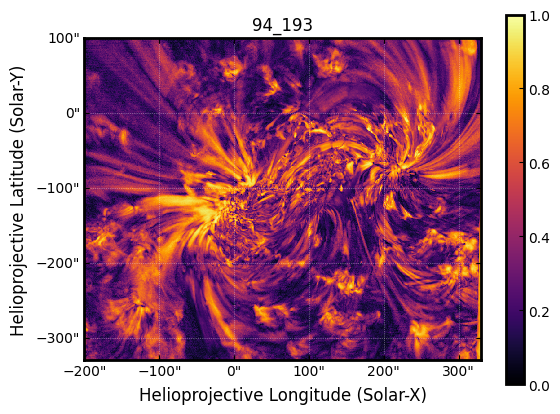

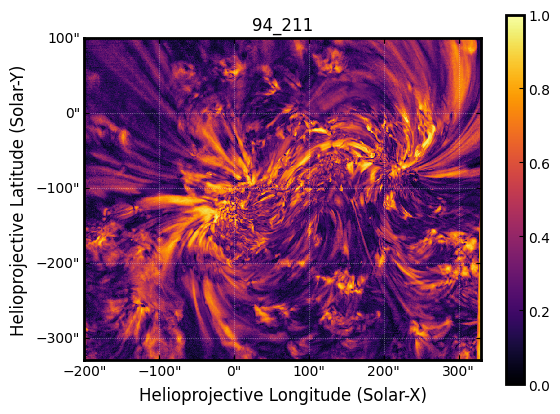

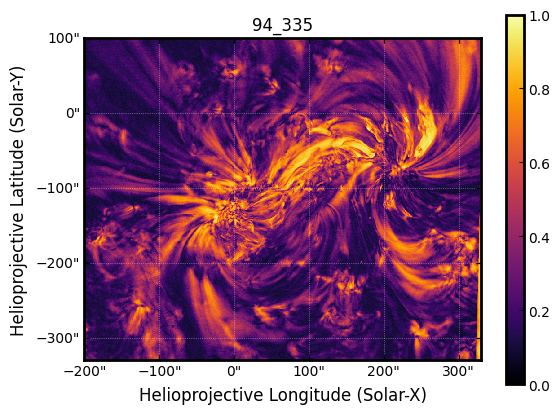

In [66]:
for k,v in cc_maps_aia[0].items():
    v.peek(vmin=0,vmax=1,cmap='inferno',title=k)